#### <u>Comparison of NoGAN Synthesizer with CTGAN</u>

##### Import Libraries

In [1]:
from ctgan import CTGAN
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from modules import utils, model, train
from timeit import default_timer as timer
import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
print(f"Pandas Version: {pd.__version__}")
print(f"NUmpy Version: {np.__version__}")
print(f"Seaborn Version: {sns.__version__}")
print(f"Matplotlib Version: {matplotlib.__version__}")

Pandas Version: 2.1.0
NUmpy Version: 1.25.2
Seaborn Version: 0.12.2
Matplotlib Version: 3.7.2


##### Default Plot Settings

In [3]:
# Default plot settings
plt.rcParams["figure.dpi"] = 300
sns.set()

In [4]:
pd.core.common.random_state(None)
seed = 42

##### Retrieve Data
Ref:

https://archive-beta.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success

In [5]:
data = utils.get_cleaned_students_data()

##### Select relevant columns and split data into training & validation set using stratified sampling

In [6]:
data = data.drop(data[data["curricular_units_2nd_sem_grade"] == 0].index)

features = [
  'curricular_units_2nd_sem_approved',
  'curricular_units_2nd_sem_grade',
  'curricular_units_1st_sem_approved',
  'curricular_units_1st_sem_grade',
  'admission_grade',
  'tuition_fees_up_to_date',
  'curricular_units_2nd_sem_evaluations',
  'age_at_enrollment',
  'previous_qualification_grade',
  'curricular_units_1st_sem_evaluations',
  'course',
  'fathers_occupation',
  'mothers_occupation',
  'unemployment_rate',
  'gdp',
  'application_mode',
  'fathers_qualification',
  'curricular_units_2nd_sem_enrolled',
  'mothers_qualification',
  'inflation_rate',
  'target']

target_column = 'target'

data = data[features]

# Stratified Test Split to make sure the target columns are distributed well in the train & test split
training_data, validation_data = \
          utils.stratified_train_test_split(data,
                                            target_column = target_column,
                                            train_size=0.5,
                                            random_state = seed
                                            )

print(f"Data Shape: {data.shape}\nTraining Shape: {training_data.shape}\nValidation Shape: {validation_data.shape}")

Data Shape: (3554, 21)
Training Shape: (1777, 21)
Validation Shape: (1777, 21)


In [7]:
comp_results = {}

#### NoGAN Training - No Hyperparameter Tuning

In [8]:
# bins = [41, 251, 11, 31, 31, 11, 31, 21, 61, 41, 131, 361, 81, 11, 1, 421, 321, 451, 351, 11, 40]
bins = [100]*len(features)

nogan = model.NoGANSynth(training_data)
start_time = timer()
synth_data, results = train.nogan_synth(nogan, training_data, 
                                        validation_data, bins = bins,
                                        n_nodes = 5000, verbose = False, 
                                        random_seed = seed)
end_time = timer()
nogan_training_time = end_time - start_time
ks_stat = results["synth_comparison"]["ks_stat"]
target_ks_stat = results["train_comparison"]["ks_stat"]

ecdf_val1, ecdf_synth = results["synth_comparison"]["ecdf_data"]
ecdf_val2, ecdf_train = results["train_comparison"]["ecdf_data"]

print(f"KS Stat (Synth vs Validation): {ks_stat:.5f}\nKS Stat (Train vs Validation): {target_ks_stat:.5f}\nRoot Squared Diff {np.sqrt((ks_stat-target_ks_stat)**2):.5f}\nTrain and Eval Time: {nogan_training_time:.5f}")

comp_results["nogan"] = {"ks_stat": ks_stat, "target_ks_stat": target_ks_stat, "root_squared_diff": np.sqrt((ks_stat-target_ks_stat)**2), "train_eval_time": nogan_training_time}

KS Stat (Synth vs Validation): 0.49522
KS Stat (Train vs Validation): 0.04164
Root Squared Diff 0.45357
Train and Eval Time: 303.35996


#### CTGAN Training

In [9]:
ctgan = CTGAN(verbose=False)

start_time = timer()
ctgan.fit(training_data, epochs = 200 )
gan_synth_data = ctgan.sample(len(validation_data))

gan_results = nogan.evaluate(training_data, validation_data,
                             gan_synth_data, 5000, verbose = False) 
end_time = timer()
gan_training_time = end_time - start_time
gan_ks_stat = gan_results["synth_comparison"]["ks_stat"]
gan_target_ks_stat = gan_results["train_comparison"]["ks_stat"]

gan_ecdf_val1, gan_ecdf_synth = gan_results["synth_comparison"]["ecdf_data"]
gan_ecdf_val2, gan_ecdf_train = gan_results["train_comparison"]["ecdf_data"]

print(f"GAN KS Stat (Synth vs Validation): {gan_ks_stat:.5f}\nGAN KS Stat (Train vs Validation): {gan_target_ks_stat:.5f}\nRoot Squared Diff {np.sqrt((gan_ks_stat-gan_target_ks_stat)**2):.5f}\nTrain and Eval Time: {gan_training_time:.5f}")

comp_results["gan"] = {"ks_stat": gan_ks_stat, "target_ks_stat": gan_target_ks_stat, "root_squared_diff": np.sqrt((gan_ks_stat-gan_target_ks_stat)**2), "train_eval_time": gan_training_time}

GAN KS Stat (Synth vs Validation): 0.57513
GAN KS Stat (Train vs Validation): 0.04558
Root Squared Diff 0.52954
Train and Eval Time: 441.69891


##### Plot with 2 variables after PCA Reduction

NoGAN PCA Plots are more similar to Actual than GAN

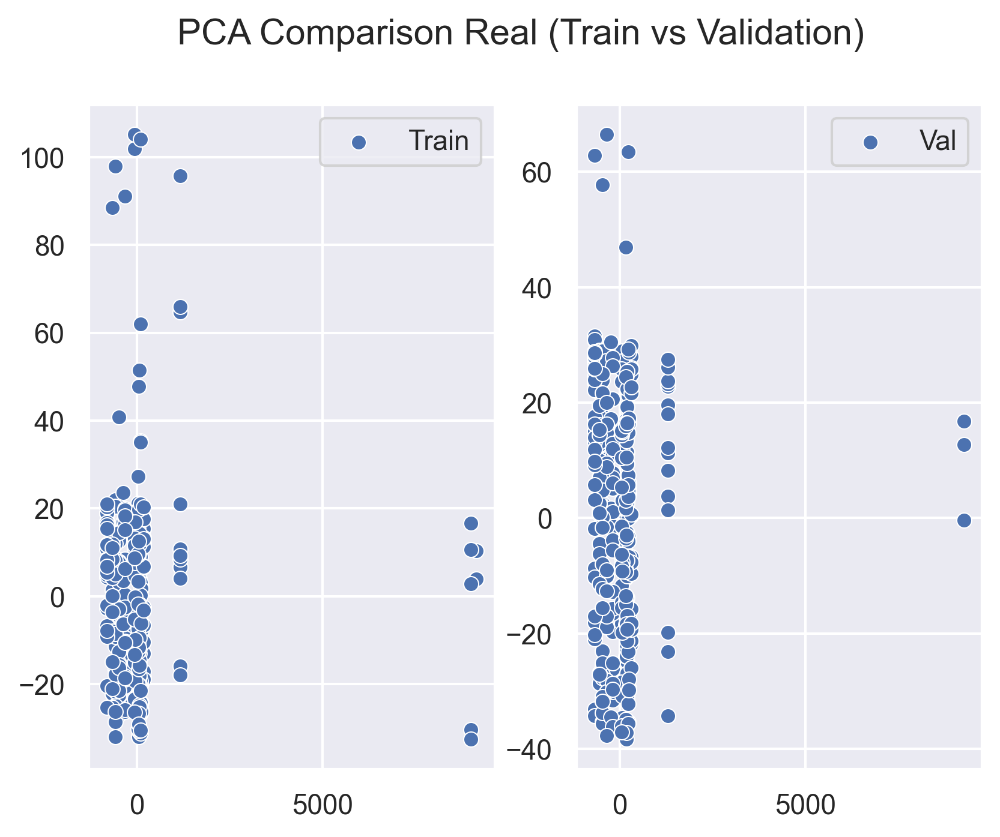

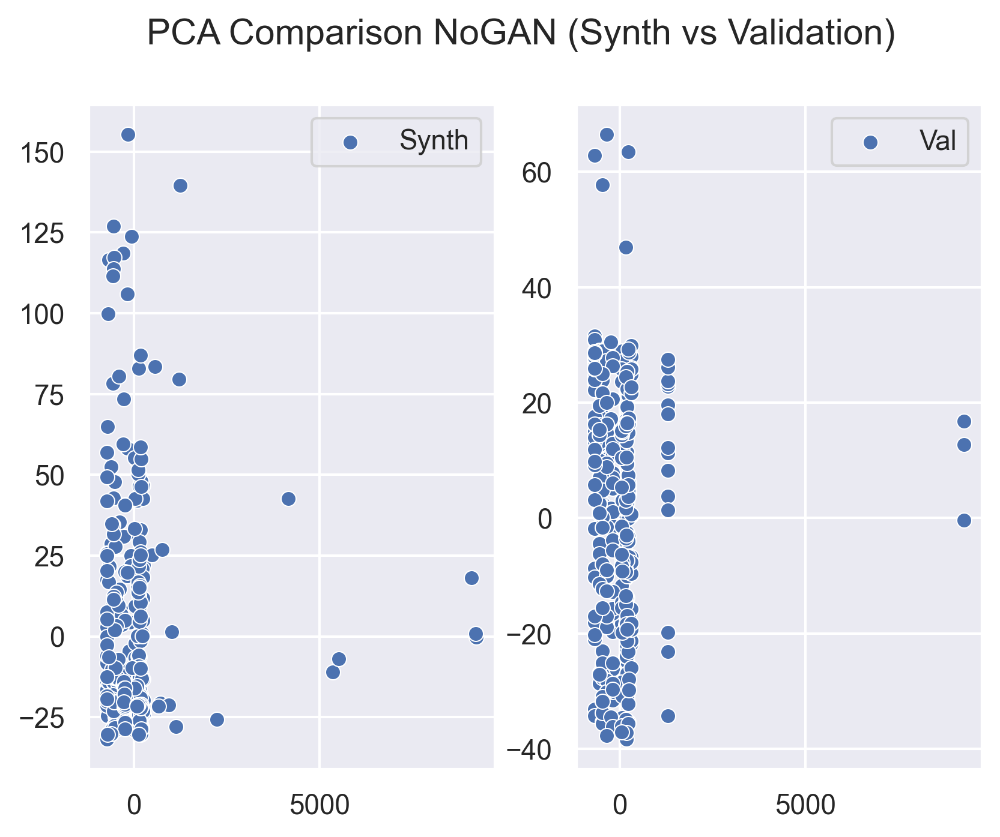

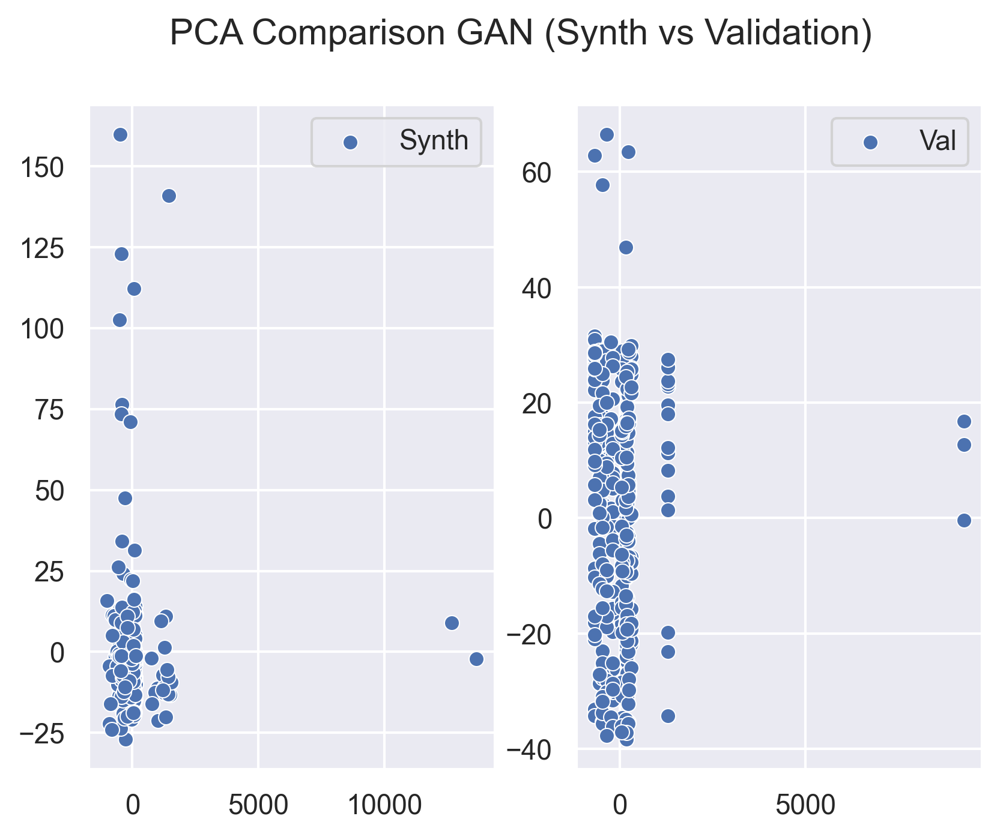

In [10]:

utils.plot_pca_comparison(training_data.query("target == 0"), 
                    validation_data.query("target == 0"), 
                    df_a_name = "Train",
                    df_b_name = "Val",     
                    title = "PCA Comparison Real (Train vs Validation)")

utils.plot_pca_comparison(synth_data.query("target == 0"), 
                    validation_data.query("target == 0"), 
                    df_a_name = "Synth",
                    df_b_name = "Val",     
                    title = "PCA Comparison NoGAN (Synth vs Validation)")

utils.plot_pca_comparison(gan_synth_data.query("target == 0"), 
                    validation_data.query("target == 0"), 
                    df_a_name = "Synth",
                    df_b_name = "Val",     
                    title = "PCA Comparison GAN (Synth vs Validation)")




##### KDE Plots NoGAN

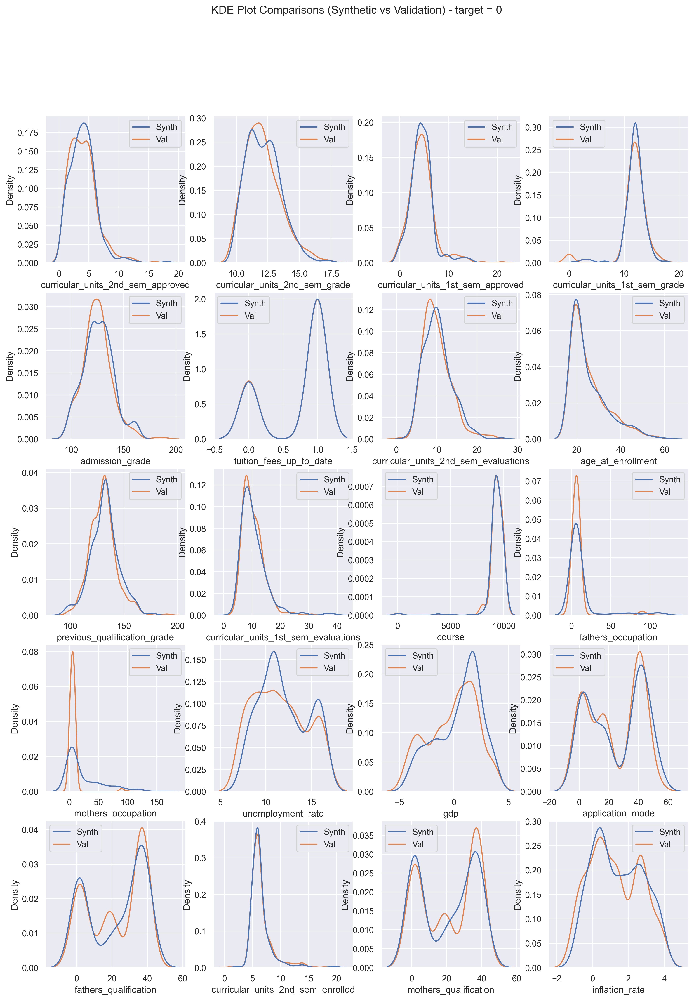

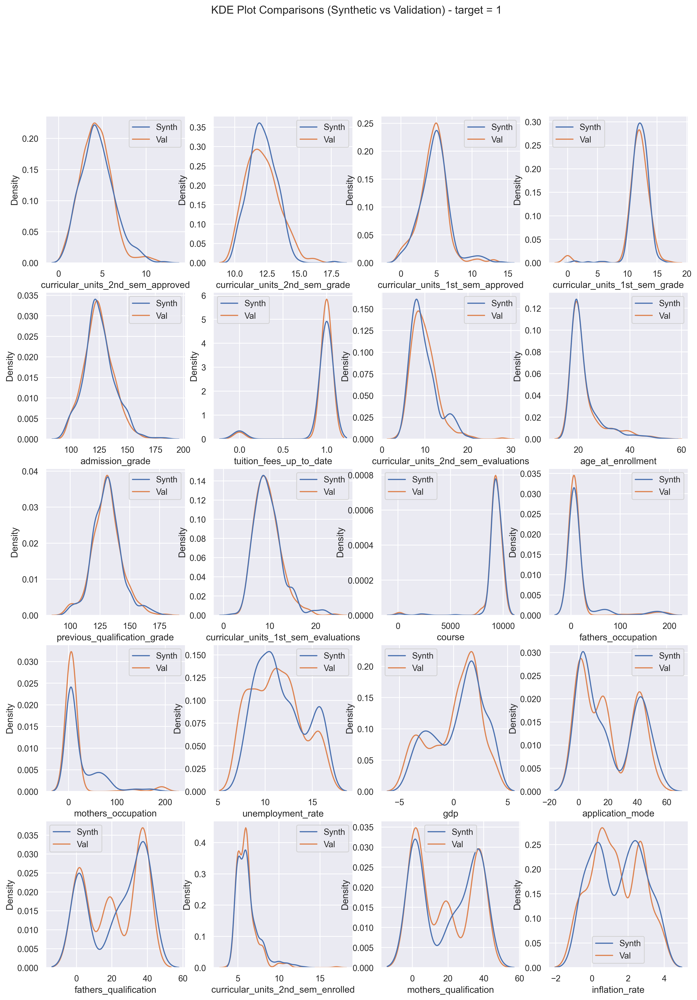

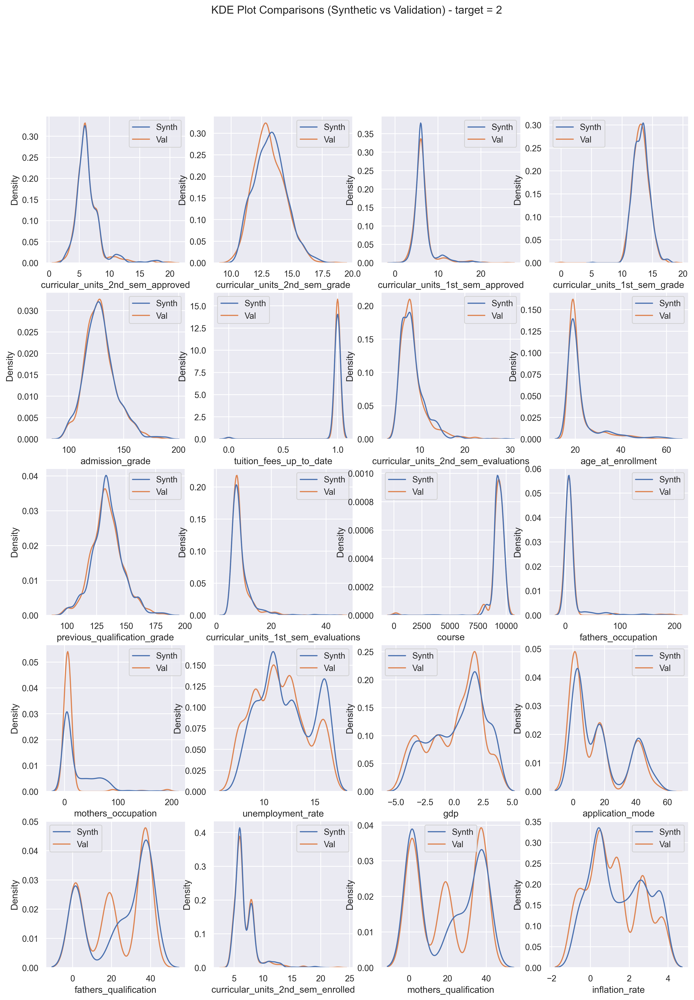

In [11]:
plot_features = list(synth_data.columns)
plot_features.remove("target")
utils.plot_density_comparison(synth_data.query("target == 0"), 
                                validation_data.query("target == 0"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",
                                features = plot_features, 
                                title = "KDE Plot Comparisons (Synthetic vs Validation) - target = 0")

utils.plot_density_comparison(synth_data.query("target == 1"), 
                                validation_data.query("target == 1"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons (Synthetic vs Validation) - target = 1")

utils.plot_density_comparison(synth_data.query("target == 2"), 
                                validation_data.query("target == 2"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons (Synthetic vs Validation) - target = 2")

##### KDE Plot CTGAN

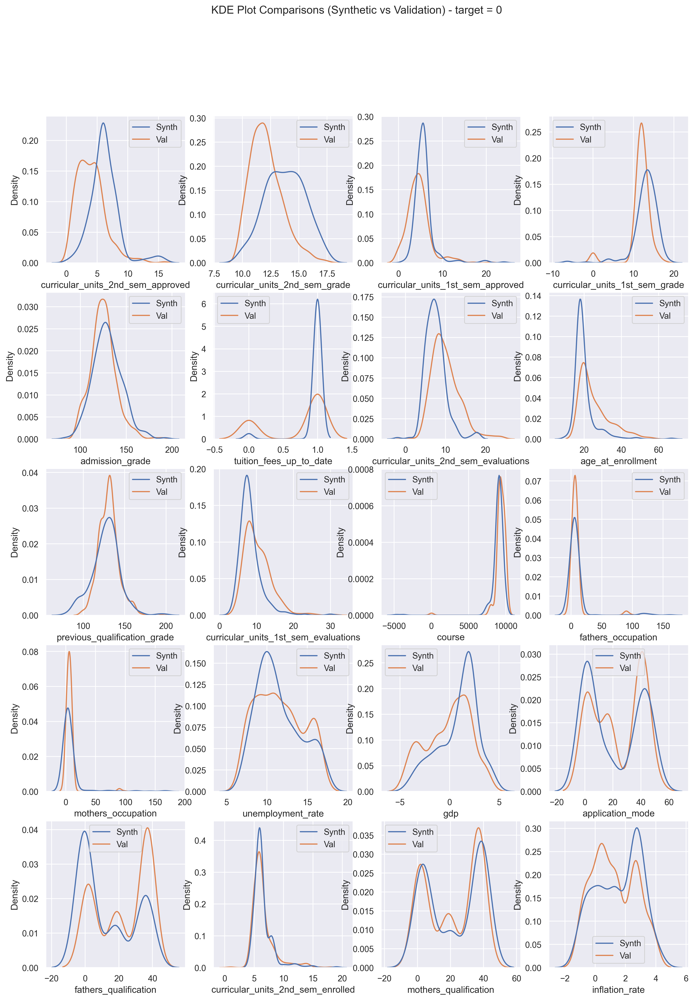

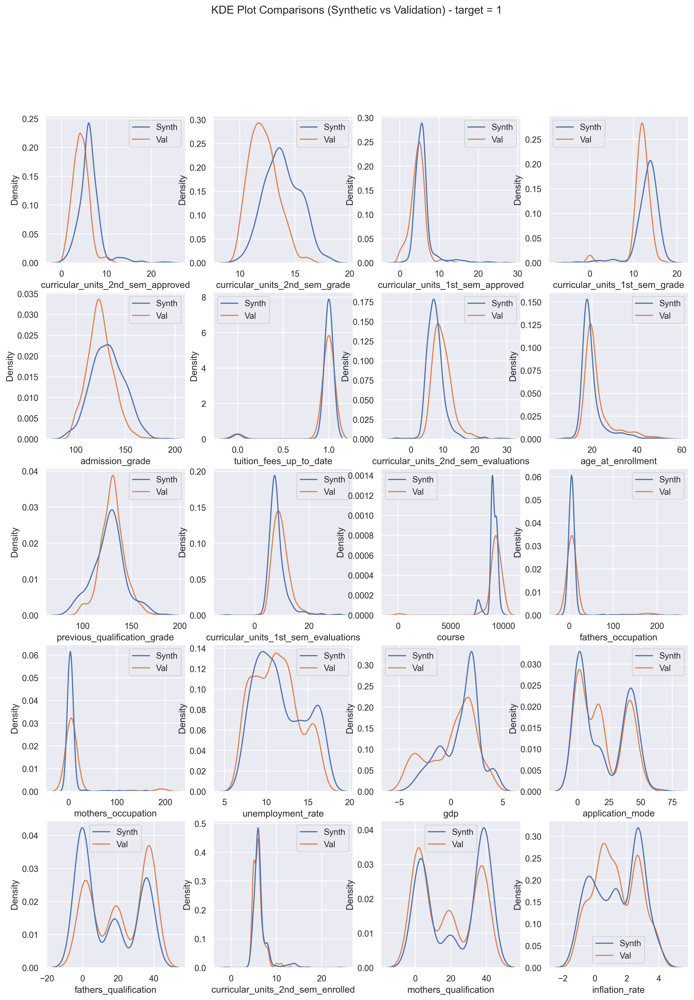

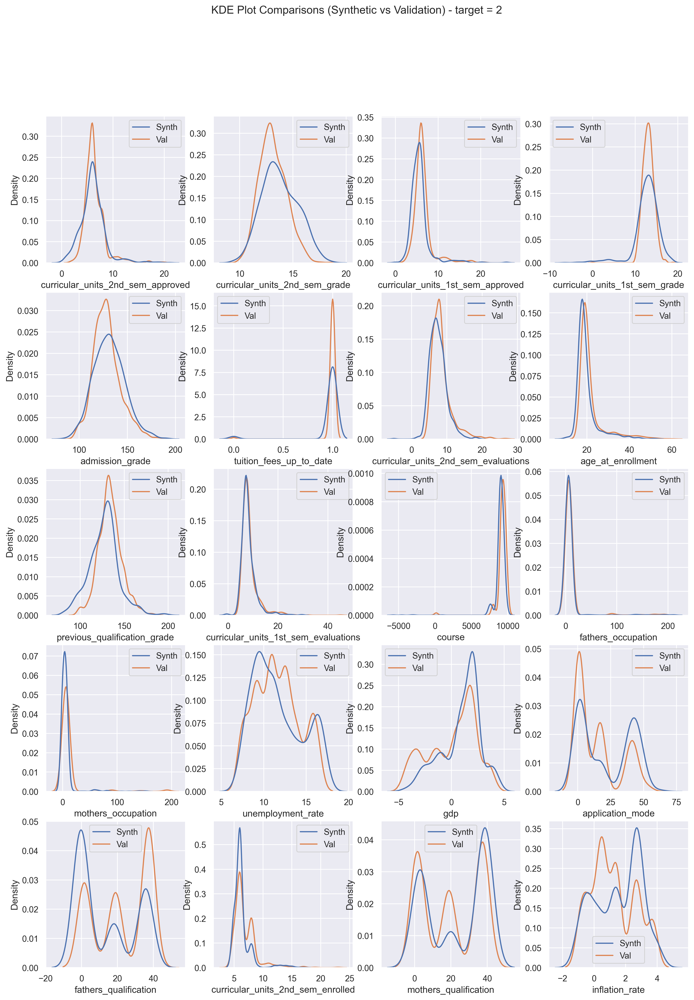

In [12]:
plot_features = list(synth_data.columns)
plot_features.remove("target")
utils.plot_density_comparison(gan_synth_data.query("target == 0"), 
                                validation_data.query("target == 0"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",
                                features = plot_features, 
                                title = "KDE Plot Comparisons (Synthetic vs Validation) - target = 0")

utils.plot_density_comparison(gan_synth_data.query("target == 1"), 
                                validation_data.query("target == 1"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons (Synthetic vs Validation) - target = 1")

utils.plot_density_comparison(gan_synth_data.query("target == 2"), 
                                validation_data.query("target == 2"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons (Synthetic vs Validation) - target = 2")

#### Results


In [13]:
final_results_df = pd.DataFrame.from_dict(comp_results, orient="index").reset_index().rename(columns = {"index": "algorithm"})
final_results_df

,algorithm,ks_stat,target_ks_stat,root_squared_diff,train_eval_time
0,nogan,0.495217,0.041643,0.453573,303.359964
1,gan,0.575127,0.045582,0.529544,441.698911


##### <u>Observations</u>
* NoGAN runs 45% faster with better KS Distance stat
* KDE plots show that distributions of NoGAN synthesized data column are more similar to validation data than the CTGAN ones